In [11]:
import os
import yaml
from pathlib import Path
from ultralytics import YOLO
import torch

# Пути
WEIGHTS_DIR = Path(r"E:\constructions_monitoring\powerlines\pl_weights")
# TEST_IMAGE = Path(r"E:\constructions_monitoring\powerlines\frames\1163225_Drone_Aerial_3840x2160_frame_0005.jpg")
TEST_IMAGE = Path(r"E:\constructions_monitoring\powerlines\Wires\za-rabotoj.jpg")


def analyze_model_info(model_path: Path):
    """Анализирует информацию о модели"""
    print(f"\n{'='*60}")
    print(f"АНАЛИЗ МОДЕЛИ: {model_path.name}")
    print(f"{'='*60}")
    
    try:
        # Загружаем модель
        model = YOLO(str(model_path))
        
        # Основная информация
        print(f"📊 ОСНОВНАЯ ИНФОРМАЦИЯ:")
        print(f"   Файл: {model_path.name}")
        print(f"   Размер: {model_path.stat().st_size / (1024*1024):.1f} MB")
        print(f"   Архитектура: {model.model.__class__.__name__}")
        
        # Количество классов и их названия
        if hasattr(model, 'names') and model.names:
            print(f"   Количество классов: {len(model.names)}")
            print(f"   Классы: {list(model.names.values())}")
        else:
            print(f"   Классы: Не определены")
        
        # Проверяем тип задачи
        if hasattr(model.model, 'yaml'):
            task = getattr(model.model, 'yaml', {}).get('task', 'detect')
            print(f"   Тип задачи: {task}")
        
        # Дополнительная информация о модели
        if hasattr(model.model, 'yaml') and model.model.yaml:
            yaml_info = model.model.yaml
            if isinstance(yaml_info, dict):
                print(f"\n📋 КОНФИГУРАЦИЯ МОДЕЛИ:")
                for key, value in yaml_info.items():
                    if key in ['nc', 'task', 'scale', 'backbone', 'head']:
                        print(f"   {key}: {value}")
        
        # Проверяем веса
        print(f"\n⚖️ ИНФОРМАЦИЯ О ВЕСАХ:")
        try:
            checkpoint = torch.load(str(model_path), map_location='cpu')
            if isinstance(checkpoint, dict):
                if 'epoch' in checkpoint:
                    print(f"   Эпоха обучения: {checkpoint['epoch']}")
                if 'best_fitness' in checkpoint:
                    print(f"   Лучший fitness: {checkpoint['best_fitness']:.4f}")
                if 'model' in checkpoint and hasattr(checkpoint['model'], 'yaml'):
                    print(f"   Конфигурация из checkpoint: {type(checkpoint['model'].yaml)}")
                
                # Ищем информацию о датасете
                if 'train_args' in checkpoint:
                    args = checkpoint['train_args']
                    if hasattr(args, 'data'):
                        print(f"   Обучен на датасете: {args.data}")
                elif 'opt' in checkpoint:
                    opt = checkpoint['opt']
                    if hasattr(opt, 'data'):
                        print(f"   Обучен на датасете: {opt.data}")
        except Exception as e:
            print(f"   Ошибка чтения checkpoint: {e}")
        
        return model
        
    except Exception as e:
        print(f"❌ ОШИБКА загрузки модели: {e}")
        return None

def test_model_prediction(model, model_name: str):
    """Тестирует модель на тестовом изображении"""
    print(f"\n🔍 ТЕСТИРОВАНИЕ НА ИЗОБРАЖЕНИИ:")
    
    if not TEST_IMAGE.exists():
        print(f"❌ Тестовое изображение не найдено: {TEST_IMAGE}")
        return
    
    try:
        # Предсказание
        results = model.predict(
            source=str(TEST_IMAGE),
            conf=0.05,
            save=False,
            verbose=False
        )
        
        if results and len(results) > 0:
            result = results[0]
            
            # Статистика детекций
            if hasattr(result, 'boxes') and result.boxes is not None:
                boxes = result.boxes
                print(f"   Найдено объектов: {len(boxes)}")
                
                # Подсчет по классам
                if len(boxes) > 0:
                    class_counts = {}
                    for cls in boxes.cls:
                        cls_id = int(cls.item())
                        cls_name = model.names.get(cls_id, f"class_{cls_id}")
                        class_counts[cls_name] = class_counts.get(cls_name, 0) + 1
                    
                    print(f"   Распределение по классам:")
                    for cls_name, count in sorted(class_counts.items()):
                        print(f"     {cls_name}: {count}")
                    
                    # Средняя уверенность
                    avg_conf = boxes.conf.mean().item()
                    print(f"   Средняя уверенность: {avg_conf:.3f}")
            else:
                print(f"   Объекты не найдены")
            
            # Проверяем маски (для сегментации)
            if hasattr(result, 'masks') and result.masks is not None:
                print(f"   Найдено масок сегментации: {len(result.masks)}")
            
        else:
            print(f"   Нет результатов предсказания")
            
    except Exception as e:
        print(f"❌ ОШИБКА предсказания: {e}")

def main():
    """Главная функция тестирования"""
    print("🔬 БЫСТРЫЙ ТЕСТ ВСЕХ ВЕСОВ")
    print(f"Папка с весами: {WEIGHTS_DIR}")
    print(f"Тестовое изображение: {TEST_IMAGE}")
    
    if not WEIGHTS_DIR.exists():
        print(f"❌ Папка с весами не найдена: {WEIGHTS_DIR}")
        return
    
    if not TEST_IMAGE.exists():
        print(f"❌ Тестовое изображение не найдено: {TEST_IMAGE}")
        return
    
    # Находим все файлы весов
    weight_files = list(WEIGHTS_DIR.glob("*.pt"))
    
    if not weight_files:
        print(f"❌ Файлы весов (.pt) не найдены в {WEIGHTS_DIR}")
        return
    
    print(f"\nНайдено весов: {len(weight_files)}")
    
    # БЫСТРЫЙ ТЕСТ ВСЕХ МОДЕЛЕЙ СРАЗУ
    results_table = []
    
    for weight_file in sorted(weight_files):
        print(f"\n⚡ Быстрый тест: {weight_file.name}")
        
        try:
            model = YOLO(str(weight_file))
            
            # Основная информация
            size_mb = weight_file.stat().st_size / (1024*1024)
            classes_count = len(model.names) if model.names else 0
            class_names = list(model.names.values()) if model.names else []
            
            # Быстрое предсказание
            results = model.predict(str(TEST_IMAGE), conf=0.05, save=False, verbose=False)
            
            detections = 0
            class_counts = {}
            avg_conf = 0
            
            if results and results[0].boxes is not None:
                boxes = results[0].boxes
                detections = len(boxes)
                
                if detections > 0:
                    # Подсчет по классам
                    for cls in boxes.cls:
                        cls_id = int(cls.item())
                        cls_name = model.names.get(cls_id, f"class_{cls_id}")
                        class_counts[cls_name] = class_counts.get(cls_name, 0) + 1
                    
                    avg_conf = boxes.conf.mean().item()
            
            # Добавляем в таблицу
            results_table.append({
                'name': weight_file.name,
                'size_mb': size_mb,
                'classes': classes_count,
                'class_names': class_names,
                'detections': detections,
                'class_counts': class_counts,
                'avg_conf': avg_conf
            })
            
            print(f"   ✓ Классов: {classes_count}, Найдено: {detections}, Conf: {avg_conf:.3f}")
            
        except Exception as e:
            print(f"   ❌ Ошибка: {e}")
            results_table.append({
                'name': weight_file.name,
                'size_mb': 0,
                'classes': 0,
                'class_names': [],
                'detections': 0,
                'class_counts': {},
                'avg_conf': 0,
                'error': str(e)
            })
    
    # СРАВНИТЕЛЬНАЯ ТАБЛИЦА
    print(f"\n{'='*80}")
    print("📊 СРАВНИТЕЛЬНАЯ ТАБЛИЦА РЕЗУЛЬТАТОВ")
    print(f"{'='*80}")
    
    # Заголовок таблицы
    print(f"{'Модель':<25} {'Размер':<8} {'Классы':<7} {'Найдено':<8} {'Conf':<6} {'Лучшие классы'}")
    print("-" * 80)
    
    # Строки таблицы
    for result in results_table:
        name = result['name'][:24]
        size = f"{result['size_mb']:.1f}MB"
        classes = str(result['classes'])
        detections = str(result['detections'])
        conf = f"{result['avg_conf']:.3f}" if result['avg_conf'] > 0 else "0"
        
        # Топ классы
        top_classes = []
        for cls, count in sorted(result['class_counts'].items(), key=lambda x: x[1], reverse=True)[:3]:
            top_classes.append(f"{cls}:{count}")
        top_classes_str = ", ".join(top_classes)[:35]
        
        print(f"{name:<25} {size:<8} {classes:<7} {detections:<8} {conf:<6} {top_classes_str}")
    
    # ДЕТАЛЬНАЯ ИНФОРМАЦИЯ О ЛУЧШИХ МОДЕЛЯХ
    print(f"\n{'='*80}")
    print("🏆 ДЕТАЛЬНАЯ ИНФОРМАЦИЯ О ЛУЧШИХ МОДЕЛЯХ")
    print(f"{'='*80}")
    
    # Сортируем по количеству детекций
    best_models = sorted([r for r in results_table if r['detections'] > 0], 
                        key=lambda x: x['detections'], reverse=True)
    
    for i, result in enumerate(best_models[:3]):  # Топ-3
        print(f"\n🥇 #{i+1}: {result['name']}")
        print(f"   Классы ({result['classes']}): {result['class_names']}")
        print(f"   Найдено объектов: {result['detections']}")
        print(f"   Детекции по классам:")
        for cls, count in sorted(result['class_counts'].items(), key=lambda x: x[1], reverse=True):
            print(f"     {cls}: {count}")
    
    print(f"\n✅ Быстрый анализ завершен!")

if __name__ == "__main__":
    main()

🔬 БЫСТРЫЙ ТЕСТ ВСЕХ ВЕСОВ
Папка с весами: E:\constructions_monitoring\powerlines\pl_weights
Тестовое изображение: E:\constructions_monitoring\powerlines\Wires\za-rabotoj.jpg

Найдено весов: 3

⚡ Быстрый тест: pl5_best.pt
   ✓ Классов: 5, Найдено: 40, Conf: 0.093

⚡ Быстрый тест: wire_yoloe.pt
Ultralytics 8.3.112  Python-3.12.4 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 8188MiB)
YOLOe-11l-seg summary (fused): 207 layers, 27,585,363 parameters, 0 gradients, 141.9 GFLOPs
   ✓ Классов: 1, Найдено: 9, Conf: 0.056

⚡ Быстрый тест: wire_yoloe_100.pt
Ultralytics 8.3.112  Python-3.12.4 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 8188MiB)
YOLOe-11l-seg summary (fused): 207 layers, 27,585,363 parameters, 0 gradients, 141.9 GFLOPs
   ✓ Классов: 1, Найдено: 11, Conf: 0.080

📊 СРАВНИТЕЛЬНАЯ ТАБЛИЦА РЕЗУЛЬТАТОВ
Модель                    Размер   Классы  Найдено  Conf   Лучшие классы
--------------------------------------------------------------------------------
pl5_best.pt      

In [27]:
import gc
gc.collect()

0

🔬 ТЕСТ ВЕСОВ С ВИЗУАЛИЗАЦИЕЙ
Папка с весами: E:\constructions_monitoring\powerlines\pl_weights
Тестовых изображений: 2
Результаты в: E:\constructions_monitoring\powerlines\weights_test_results
Найдено изображений: 2
   ✓ 1163225_Drone_Aerial_3840x2160_frame_0005.jpg
   ✓ test_powerlines_aerial.jpg
Найдено весов: 3

ТЕСТ МОДЕЛИ: pl5_best.pt
📊 Размер: 5.7MB, Классы: 5
📋 Классы: ['pole', 'crossarm', 'wire', 'insulator', 'transformer']

🖼️  Тест на: 1163225_Drone_Aerial_3840x2160_frame_0005.jpg
     Найдено: 195, Conf: 0.023
       pole: 126
       crossarm: 56
       transformer: 8
       wire: 4
       insulator: 1
   💾 Сохранено: pl5_best_1163225_Drone_Aerial_3840x2160_frame_0005.jpg


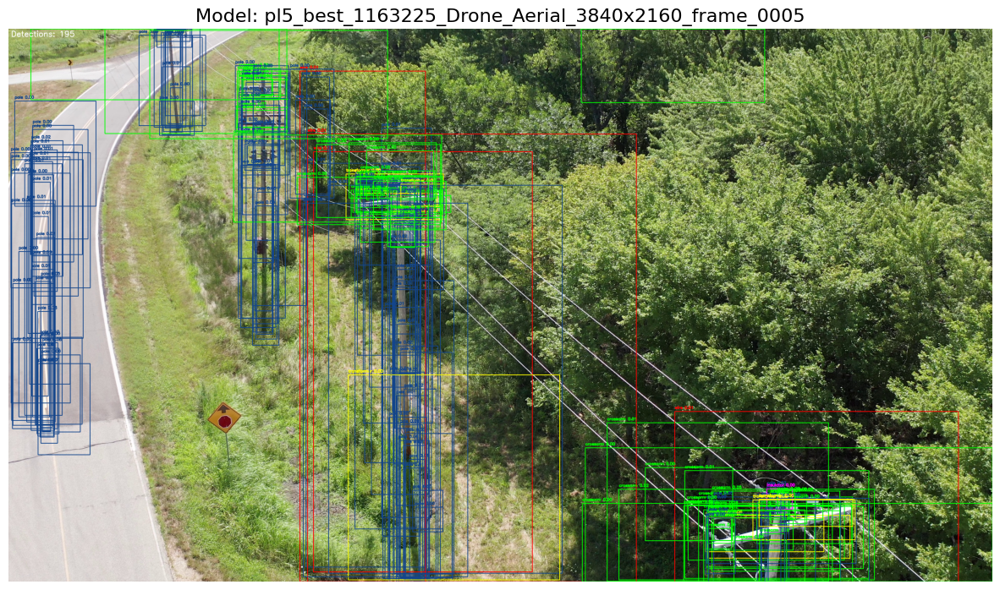


🖼️  Тест на: test_powerlines_aerial.jpg
     Найдено: 148, Conf: 0.004
       pole: 102
       crossarm: 38
       transformer: 8
   💾 Сохранено: pl5_best_test_powerlines_aerial.jpg


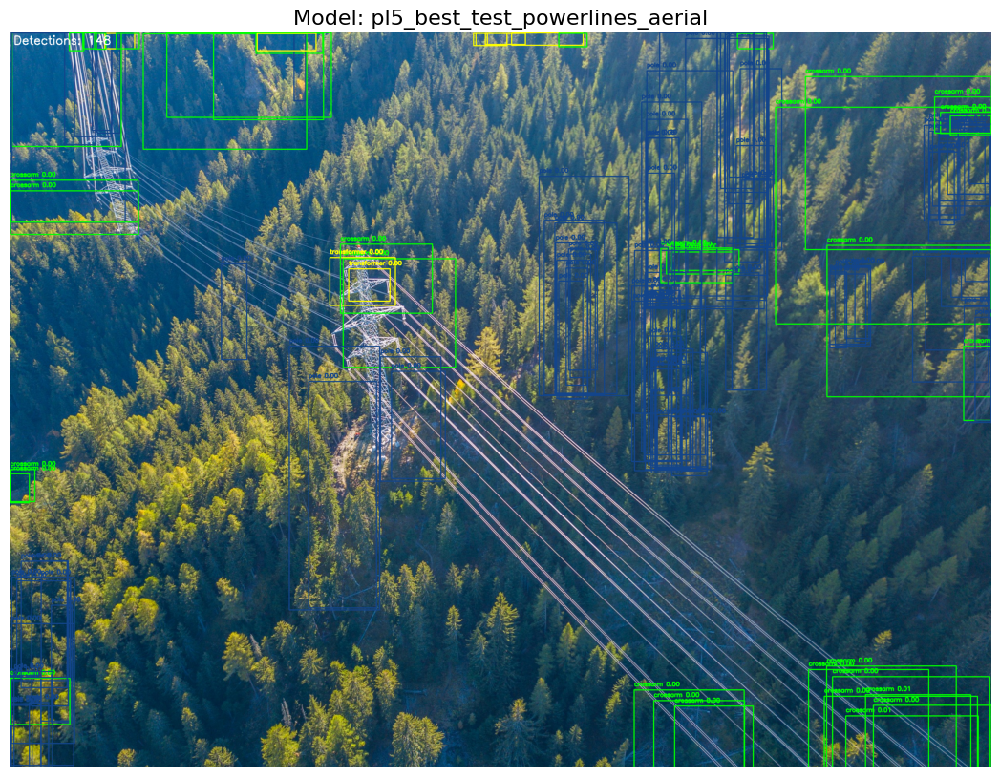


ТЕСТ МОДЕЛИ: wire_yoloe.pt
📊 Размер: 159.2MB, Классы: 1
📋 Классы: ['wire']

🖼️  Тест на: 1163225_Drone_Aerial_3840x2160_frame_0005.jpg
Ultralytics 8.3.112  Python-3.12.4 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 8188MiB)
YOLOe-11l-seg summary (fused): 207 layers, 27,585,363 parameters, 0 gradients, 141.9 GFLOPs
     Найдено: 236, Conf: 0.051
       wire: 236
   💾 Сохранено: wire_yoloe_1163225_Drone_Aerial_3840x2160_frame_0005.jpg


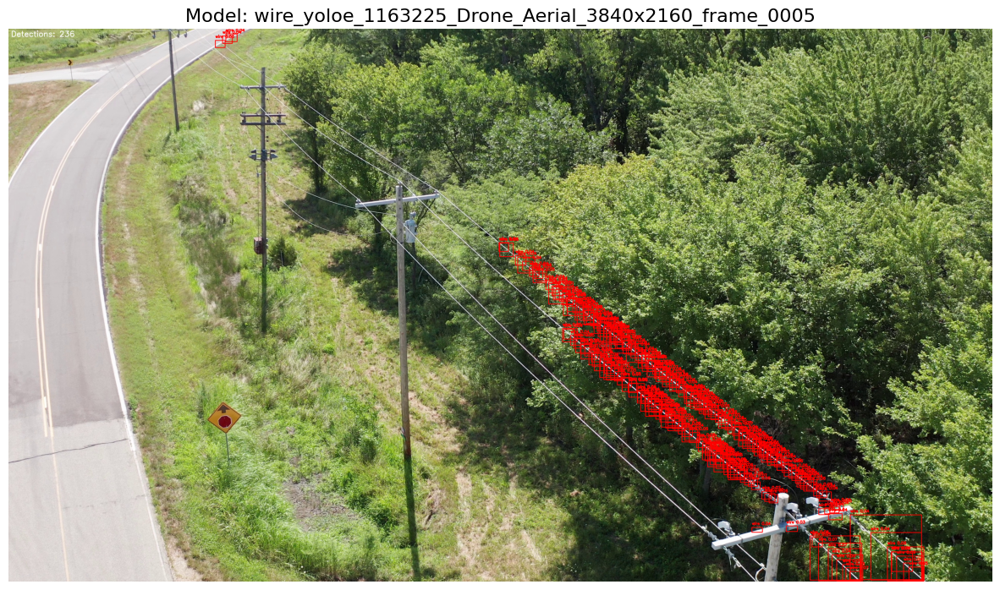


🖼️  Тест на: test_powerlines_aerial.jpg
Ultralytics 8.3.112  Python-3.12.4 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 8188MiB)
     Найдено: 179, Conf: 0.039
       wire: 179
   💾 Сохранено: wire_yoloe_test_powerlines_aerial.jpg


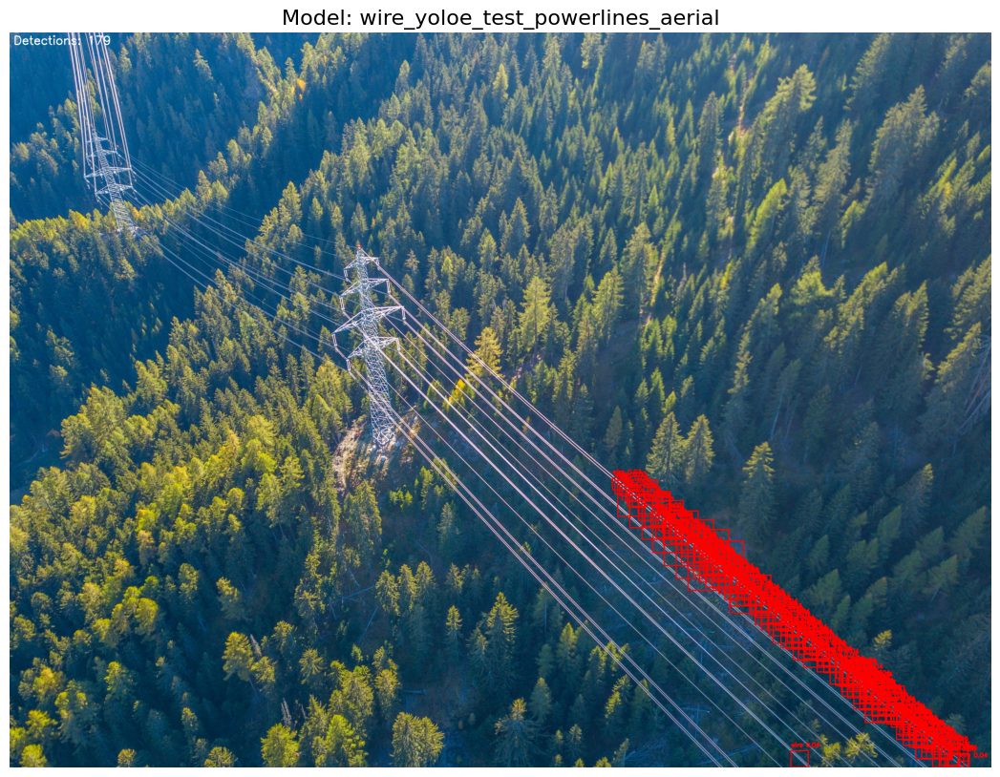


ТЕСТ МОДЕЛИ: wire_yoloe_100.pt
📊 Размер: 53.2MB, Классы: 1
📋 Классы: ['wire']

🖼️  Тест на: 1163225_Drone_Aerial_3840x2160_frame_0005.jpg
Ultralytics 8.3.112  Python-3.12.4 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 8188MiB)
YOLOe-11l-seg summary (fused): 207 layers, 27,585,363 parameters, 0 gradients, 141.9 GFLOPs
     Найдено: 217, Conf: 0.017
       wire: 217
   💾 Сохранено: wire_yoloe_100_1163225_Drone_Aerial_3840x2160_frame_0005.jpg


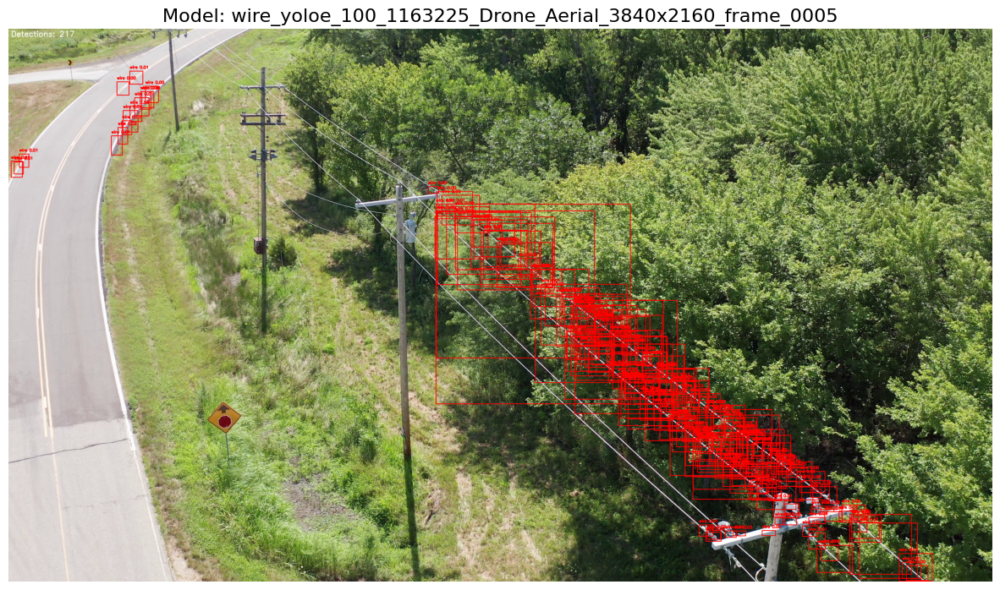


🖼️  Тест на: test_powerlines_aerial.jpg
Ultralytics 8.3.112  Python-3.12.4 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 8188MiB)
     Найдено: 138, Conf: 0.002
       wire: 138
   💾 Сохранено: wire_yoloe_100_test_powerlines_aerial.jpg


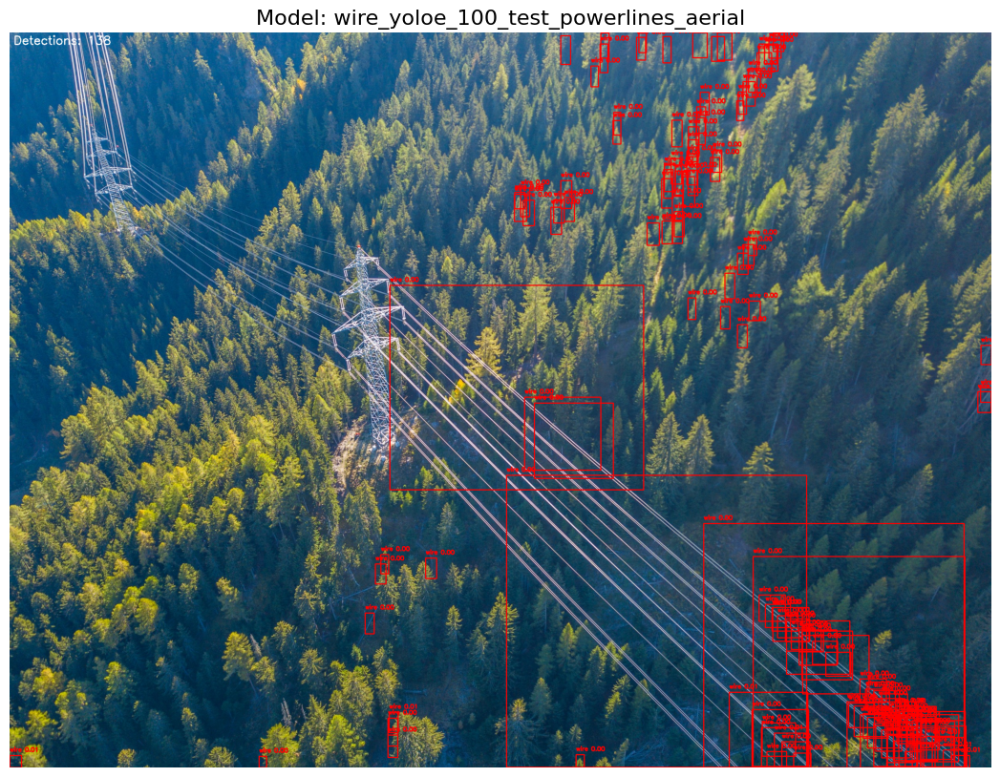


📊 ИТОГОВАЯ СВОДКА

🏆 pl5_best.pt
   Размер: 5.7MB
   Классы: ['pole', 'crossarm', 'wire', 'insulator', 'transformer']
   ИТОГО детекций: 343
   Средняя уверенность: 0.014
   По изображениям:
     1163225_Drone_Aerial_3840x2160_frame_0005.jpg: 195 (pole:126, crossarm:56, transformer:8, wire:4, insulator:1)
     test_powerlines_aerial.jpg: 148 (pole:102, crossarm:38, transformer:8)

🏆 wire_yoloe.pt
   Размер: 159.2MB
   Классы: ['wire']
   ИТОГО детекций: 415
   Средняя уверенность: 0.045
   По изображениям:
     1163225_Drone_Aerial_3840x2160_frame_0005.jpg: 236 (wire:236)
     test_powerlines_aerial.jpg: 179 (wire:179)

🏆 wire_yoloe_100.pt
   Размер: 53.2MB
   Классы: ['wire']
   ИТОГО детекций: 355
   Средняя уверенность: 0.010
   По изображениям:
     1163225_Drone_Aerial_3840x2160_frame_0005.jpg: 217 (wire:217)
     test_powerlines_aerial.jpg: 138 (wire:138)

🎨 Все изображения сохранены в: E:\constructions_monitoring\powerlines\weights_test_results
✅ Готово!


In [25]:
import os
import yaml
from pathlib import Path
from ultralytics import YOLO
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Пути
WEIGHTS_DIR = Path(r"E:\constructions_monitoring\powerlines\pl_weights")

# ТЕСТОВЫЕ ИЗОБРАЖЕНИЯ (можешь добавить/убрать)
TEST_IMAGES = [
    Path(r"E:\constructions_monitoring\powerlines\frames\1163225_Drone_Aerial_3840x2160_frame_0005.jpg"),
    Path(r"E:\constructions_monitoring\powerlines\Wires\test_powerlines_aerial.jpg")
]

RESULTS_DIR = Path(r"E:\constructions_monitoring\powerlines\weights_test_results")
RESULTS_DIR.mkdir(exist_ok=True)

# Цвета для классов
COLORS = {
    'pole': (139, 69, 19),      # коричневый
    'crossarm': (0, 255, 0),    # зеленый
    'wire': (0, 0, 255),        # красный
    'insulator': (255, 0, 255), # пурпурный
    'transformer': (0, 255, 255) # голубой
}

def show_in_jupyter(img, title="Image"):
    """Показывает изображение в Jupyter"""
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title, fontsize=16)
    plt.axis('off')
    plt.show()

def draw_predictions(img, results, model, save_path):
    """Рисует предсказания на изображении"""
    if not results or len(results) == 0:
        return img
    
    result = results[0]
    vis_img = img.copy()
    
    # Рисуем боксы
    if hasattr(result, 'boxes') and result.boxes is not None:
        boxes = result.boxes
        
        for i in range(len(boxes)):
            # Координаты
            x1, y1, x2, y2 = boxes.xyxy[i].cpu().numpy().astype(int)
            conf = boxes.conf[i].cpu().numpy()
            cls_id = int(boxes.cls[i].cpu().numpy())
            
            # Название класса
            cls_name = model.names.get(cls_id, f"class_{cls_id}")
            
            # Цвет
            color = COLORS.get(cls_name, (0, 255, 0))
            
            # Рисуем бокс
            cv2.rectangle(vis_img, (x1, y1), (x2, y2), color, 2)
            
            # Подпись
            label = f"{cls_name} {conf:.2f}"
            cv2.putText(vis_img, label, (x1, y1-10), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    
    # Добавляем информацию
    info = f"Detections: {len(result.boxes) if result.boxes else 0}"
    cv2.putText(vis_img, info, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    
    # Сохраняем
    cv2.imwrite(str(save_path), vis_img)
    print(f"   💾 Сохранено: {save_path.name}")
    
    # Показываем в Jupyter
    model_name = save_path.stem
    show_in_jupyter(vis_img, f"Model: {model_name}")
    
    return vis_img

def test_model_on_images(model_path: Path, valid_images):
    """Тестирует модель на всех изображениях"""
    print(f"\n{'='*60}")
    print(f"ТЕСТ МОДЕЛИ: {model_path.name}")
    print(f"{'='*60}")
    
    try:
        model = YOLO(str(model_path))
        
        # Информация о модели
        size_mb = model_path.stat().st_size / (1024*1024)
        classes_count = len(model.names) if model.names else 0
        class_names = list(model.names.values()) if model.names else []
        
        print(f"📊 Размер: {size_mb:.1f}MB, Классы: {classes_count}")
        print(f"📋 Классы: {class_names}")
        
        model_results = []
        
        # Тестируем на каждом изображении
        for img_path in valid_images:
            print(f"\n🖼️  Тест на: {img_path.name}")
            
            # Загружаем изображение
            img = cv2.imread(str(img_path))
            if img is None:
                print(f"❌ Не удалось загрузить: {img_path.name}")
                continue
            
            # Предсказание
            results = model.predict(str(img_path), conf=0.001, save=False, verbose=False)
            
            # Подсчет детекций
            detections = 0
            class_counts = {}
            avg_conf = 0
            
            if results and results[0].boxes is not None:
                boxes = results[0].boxes
                detections = len(boxes)
                
                if detections > 0:
                    for cls in boxes.cls:
                        cls_id = int(cls.item())
                        cls_name = model.names.get(cls_id, f"class_{cls_id}")
                        class_counts[cls_name] = class_counts.get(cls_name, 0) + 1
                    
                    avg_conf = boxes.conf.mean().item()
            
            print(f"     Найдено: {detections}, Conf: {avg_conf:.3f}")
            if class_counts:
                for cls, count in class_counts.items():
                    print(f"       {cls}: {count}")
            
            # Визуализация
            img_name = img_path.stem
            model_name = model_path.stem
            save_path = RESULTS_DIR / f"{model_name}_{img_name}.jpg"
            
            draw_predictions(img, results, model, save_path)
            
            # Сохраняем результат
            model_results.append({
                'image': img_path.name,
                'detections': detections,
                'class_counts': class_counts,
                'avg_conf': avg_conf
            })
        
        return {
            'name': model_path.name,
            'size_mb': size_mb,
            'classes': classes_count,
            'class_names': class_names,
            'results': model_results
        }
        
    except Exception as e:
        print(f"❌ Ошибка: {e}")
        return None

def main():
    """Главная функция"""
    print("🔬 ТЕСТ ВЕСОВ С ВИЗУАЛИЗАЦИЕЙ")
    print(f"Папка с весами: {WEIGHTS_DIR}")
    print(f"Тестовых изображений: {len(TEST_IMAGES)}")
    print(f"Результаты в: {RESULTS_DIR}")
    
    # Проверяем существование изображений
    valid_images = [img for img in TEST_IMAGES if img.exists()]
    print(f"Найдено изображений: {len(valid_images)}")
    for img in valid_images:
        print(f"   ✓ {img.name}")
    
    if not valid_images:
        print("❌ Нет доступных изображений!")
        return
    
    # Находим веса
    weight_files = list(WEIGHTS_DIR.glob("*.pt"))
    if not weight_files:
        print("❌ Веса не найдены!")
        return
    
    print(f"Найдено весов: {len(weight_files)}")
    
    # Тестируем каждую модель
    all_results = []
    
    for weight_file in sorted(weight_files):
        result = test_model_on_images(weight_file, valid_images)
        if result:
            all_results.append(result)
    
    # ИТОГОВАЯ СВОДКА
    print(f"\n{'='*80}")
    print("📊 ИТОГОВАЯ СВОДКА")
    print(f"{'='*80}")
    
    for result in all_results:
        total_detections = sum(r['detections'] for r in result['results'])
        avg_conf_all = np.mean([r['avg_conf'] for r in result['results'] if r['avg_conf'] > 0])
        
        print(f"\n🏆 {result['name']}")
        print(f"   Размер: {result['size_mb']:.1f}MB")
        print(f"   Классы: {result['class_names']}")
        print(f"   ИТОГО детекций: {total_detections}")
        print(f"   Средняя уверенность: {avg_conf_all:.3f}" if not np.isnan(avg_conf_all) else "   Средняя уверенность: 0")
        
        print(f"   По изображениям:")
        for r in result['results']:
            classes_str = ", ".join([f"{k}:{v}" for k,v in r['class_counts'].items()])
            print(f"     {r['image']}: {r['detections']} ({classes_str})")
    
    print(f"\n🎨 Все изображения сохранены в: {RESULTS_DIR}")
    print(f"✅ Готово!")

if __name__ == "__main__":
    main()